# Image Processing

In [2]:
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.auto import tqdm
from IPython.display import HTML
from scipy.signal import convolve2d
from matplotlib.animation import FuncAnimation

In [3]:
def normalize_im(im):
    return (im - im.min(axis=(0, 1))) / (im.max(axis=(0, 1)) - im.min(axis=(0, 1)))

## Image Filtering

### Revisiting the Heat Kernel Problem

The Heat Equation is written, in Euclidean coordinates, as,

$$\frac{\partial u}{\partial t} = \alpha \Delta u$$

where $\Delta u = \frac{\partial^{2} u}{\partial x_{1}^{2}} + \cdots + \frac{\partial^{2} u}{\partial x_{d}^{2}}$ is called __the Laplacian__ of the function $u(t, \mathbf{x})$.

We want to solve the Heat Equation over an uniform grid, i.e., an image. As such, $\mathbf{x} = (x, y)$. As follows we discretize the $x$ and $y$ axis as $x_{0} < x_{1} < \cdots < x_{w-1}$ and $y_{0} < y_{1} < \cdots < y_{h-1}$, where $x_{i} = x_{0} + i\delta x$ and $y_{j} = y_{0} + j\delta y$. The variables $\delta x$ and $\delta y$ are the precision of the discretization. Likewise, we want to discretize $u$ over time. As such we let $t_{0} < t_{1}, \cdots, t_{T-1}$ and $t_{k} = t_{0} + k \delta t$. To simplify our notation, we use,

$$u_{k,i,j} = u(t_{k},x_{i}, y_{j})$$

In this sense, we need to fill a 3-D array $\mathbf{U} \in \mathbb{R}^{T \times h \times w}$.

#### Deriving the Discretization

We derive our iterations by approximating derivatives through finite differences. Note that,

$$\dfrac{\partial u}{\partial x} \approx \frac{u(t,x+\delta x, y) - u(t,x,y)}{\delta x} = \frac{u_{k,i+1,j}-u_{k,i,j}}{\delta x}$$

so that,

$$\dfrac{\partial^{2} u}{\partial x^{2}} \approx \frac{\partial_{x}u(t,x+\delta x, y) - \partial_{x}u(t,x,y)}{\delta x} = \frac{1}{\delta x}\biggr{(}\frac{u_{k,i+2,j}-u_{k,i+1,j}}{\delta x} - \frac{u_{k,i+1,j}-u_{k,i,j}}{\delta x}\biggr{)}$$

that is,

$$\dfrac{\partial^{2} u}{\partial x^{2}} \approx \frac{u_{k,i+2,j} - 2 u_{k,i+1,j} + u_{k,i,j}}{\delta x^{2}}$$

Note that we may choose any indices $(k, i, j)$. As such, we let $i := i - 1$, so that,

$$\dfrac{\partial^{2} u}{\partial x^{2}} \approx \frac{u_{k,i+1,j} - 2 u_{k,i,j} + u_{k,i-1,j}}{\delta x^{2}}$$

Now, assuming an uniform spatial step $\delta x = \delta y$, the Laplacian is written as,

$$\Delta u = \dfrac{\alpha}{\delta x^{2}}(u_{k,i+1,j}+u_{k,i,j+1}-4u_{k,i,j}+u_{k,i-1,j}+u_{k,i,j-1})$$

Note that, since we discretized the time, the time-derivative $\frac{\partial u}{\partial t}$ is written as,

$$\frac{\partial u}{\partial t} = \frac{u_{k+1,i,j} - u_{k,i,j}}{\delta t}$$

hence,

$$u_{k+1,i,j} = u_{k,i,j} + \tilde{\alpha}(u_{k,i+1,j}+u_{k,i,j+1}-4u_{k,i,j}+u_{k,i-1,j}+u_{k,i,j-1})$$

where $\tilde{\alpha} = \alpha\frac{\delta t}{\delta x^{2}}$. In a real physics problem, discretization should be done in a careful way so that $\tilde{\alpha} \leq 0.5$. This is a consequence of [Von Neumann's stability analysis](https://en.wikipedia.org/wiki/Von_Neumann_stability_analysis). In our case, we are not interested with the physics of the problem, but rather how the heat equation affects an image. As such we set $\tilde{\alpha} := 0.5$.

#### Initial Conditions

As initial conditions for the problem, we assume the following case:

- let $\mathbf{c}_{0} = (170, 170)$. $u_{0,i,j} = 1$ for all $\mathbf{x} = (i,j)$ s.t. $|| \mathbf{c}_{0} - \mathbf{x} ||_{2} \leq 20$
- let $\mathbf{c}_{1} = (85, 85)$. $u_{0,i,j} = 1$ for all $\mathbf{x} = (i,j)$ s.t. $|| \mathbf{c}_{1} - \mathbf{x} ||_{2} \leq 30$

This should generate two circles on the image.

In [3]:
n = 256

In [4]:
u0 = np.zeros([n, n])
cx, cy = 2 * n // 3, 2 * n // 3
r1, r2 = 20, 30

for i in range(n):
    for j in range(n):
        x = np.array([cx, cy])
        y = np.array([i, j])

        if np.linalg.norm(x - y) <= r1:
            u0[i, j] = 1.

cx, cy = 1 * n // 3, 1 * n // 3

for i in range(n):
    for j in range(n):
        x = np.array([cx, cy])
        y = np.array([i, j])

        if np.linalg.norm(x - y) <= r2:
            u0[i, j] = 1.

(-0.5, 255.5, 255.5, -0.5)

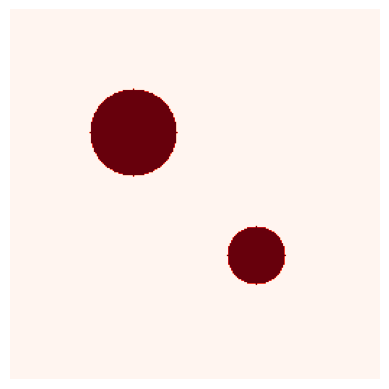

In [5]:
plt.figure()
plt.imshow(u0, cmap=plt.cm.Reds, vmin=0., vmax=1.)
plt.axis('off')

#### Naïve Implementation

First, recall that we need to implement the Laplacian over the image, which has this expression,

$$u_{k+1,i,j} = u_{k,i,j} + \frac{1}{2}(u_{k,i+1,j}+u_{k,i,j+1}-4u_{k,i,j}+u_{k,i-1,j}+u_{k,i,j-1})$$

so we start by programming a function that receives $\mathbf{U}[k, :, :]$ and a pixel $(i, j)$, and outputs the value $(\Delta u)[i, j]$.

In [6]:
def laplacian(u, i, j):
    h, w = u.shape
    if i + 1 < h:
        up = u[i + 1, j]
    else:
        up = 0

    if i - 1 > 0:
        down = u[i - 1, j]
    else:
        down = 0

    if j + 1 < w:
        right = u[i, j + 1]
    else:
        right = 0

    if j - 1 > 0:
        left = u[i, j - 1]
    else:
        left = 0

    return (up + down + left + right) - 4 * u[i, j]

Let us see the effect of the Laplacian on the initial conditions,

In [7]:
lap_u = np.zeros([n, n])

for i in range(n):
    for j in range(n):
        lap_u[i, j] = laplacian(u0, i, j)

(-0.5, 255.5, 255.5, -0.5)

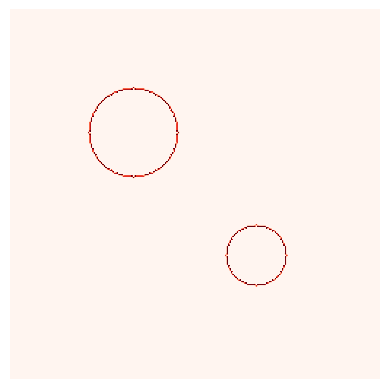

In [8]:
plt.figure()
plt.imshow(lap_u, cmap=plt.cm.Reds, vmin=0., vmax=1.)
plt.axis('off')

Now, let us iterate over the equation 100 times,

In [9]:
n_iter = 100
U = np.zeros([n_iter, n, n])
U[0, ...] = u0.copy()

In [10]:
print(U.shape)

(100, 256, 256)


In [11]:
for it in tqdm(range(1, n_iter)):
    lap_u = np.zeros([n, n])

    for i in range(n):
        for j in range(n):
            lap_u[i, j] = laplacian(U[it - 1, ...], i, j)

    U[it, ...] = U[it - 1, ...] + 0.25 * lap_u

  0%|          | 0/99 [00:00<?, ?it/s]

and the animation,

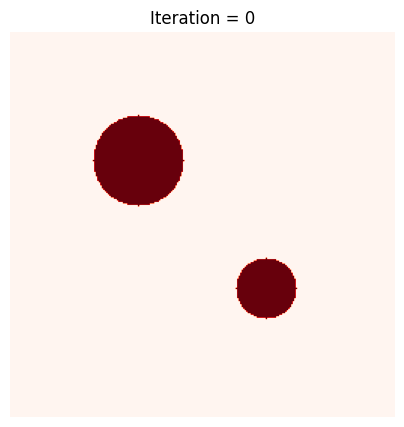

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(U[0, ...], cmap=plt.cm.Reds, vmin=0., vmax=1.)
ax.set_title(f'Iteration = {0}')
ax.axis('off')

it = 0


def update(frame):
    global it
    # clear the axis each frame
    ax.clear()
    ax.imshow(frame, cmap=plt.cm.Reds, vmin=0., vmax=1.)
    ax.set_title(f'Iteration = {it}')
    ax.axis('off')

    it += 1


anim = FuncAnimation(fig, update, frames=U[::10])

In [13]:
HTML(anim.to_jshtml())

#### Optimized Implementation

For the optimized implementation, we will use Broadcasting. Note that we cannot broadcast over the temporal axis, because in order to compute the image at $t_{k+1}$ we need to compute $t_{k}$.

Furthermore, note that in the ```laplacian``` function, we needed to use if-else to verify the boundary conditions. Since we need to look over a neighborhood of a pixel, we needed to check whether the neighbors $(i+1,j),(i-1,j),(i,j+1),(i,j-1)$ of $(i,j)$ exist.

To vectorize our solution, we need to __pad__ the original $u$ with zeros around the boundaries (i.e., $\mathbf{U} \in \mathbb{R}^{T\times (h+1)\times (w+1)}$).

In [14]:
n = 256
n_iter = 100
U = np.zeros([n_iter, n + 2, n + 2])
U[0, 1:-1, 1:-1] = u0.copy()

In [15]:
for it in tqdm(range(0, n_iter - 1)):
    U[it + 1, 1:-1, 1:-1] = U[it, 1:-1, 1:-1] + 0.25 * (U[it, :-2, 1:-1] +
                                                        U[it, 2:, 1:-1] +
                                                        U[it, 1:-1, :-2] +
                                                        U[it, 1:-1, 2:] -
                                                        4 * U[it, 1:-1, 1:-1])

  0%|          | 0/99 [00:00<?, ?it/s]

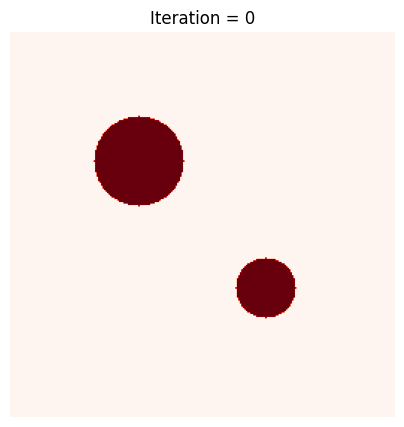

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(U[0, ...], cmap=plt.cm.Reds, vmin=0., vmax=1.)
ax.set_title(f'Iteration = {0}')
ax.axis('off')

it = 0


def update(frame):
    global it
    # clear the axis each frame
    ax.clear()
    ax.imshow(frame, cmap=plt.cm.Reds, vmin=0., vmax=1.)
    ax.set_title(f'Iteration = {it}')
    ax.axis('off')

    it += 1


anim = FuncAnimation(fig, update, frames=U[::10])

In [17]:
HTML(anim.to_jshtml())

#### Applying the optimized implementation to a real image

In [18]:
im = np.array(Image.open('../data/101085.jpg'))

print(im.shape, im.dtype, im.max(), im.min())

(481, 321, 3) uint8 255 0


In [19]:
u0 = (im.astype(float) / 255)

(-0.5, 320.5, 480.5, -0.5)

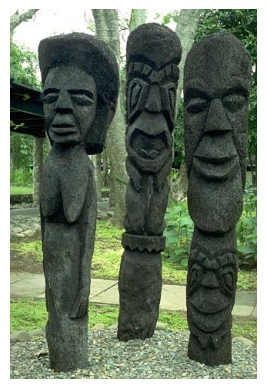

In [20]:
plt.imshow(u0)
plt.axis('off')

In [22]:
n_iter = 100
h, w, c = u0.shape
U = np.zeros([n_iter, h + 2, w + 2, c])
U[0, 1:-1, 1:-1] = u0.copy()

In [23]:
for it in tqdm(range(0, n_iter - 1)):
    U[it + 1, 1:-1, 1:-1] = U[it, 1:-1, 1:-1] + 0.25 * (U[it, :-2, 1:-1] +
                                                        U[it, 2:, 1:-1] +
                                                        U[it, 1:-1, :-2] +
                                                        U[it, 1:-1, 2:] -
                                                        4 * U[it, 1:-1, 1:-1])

  0%|          | 0/99 [00:00<?, ?it/s]

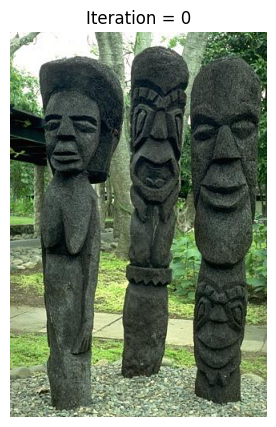

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(U[0, 1:-1, 1:-1, :], cmap=plt.cm.Reds, vmin=0., vmax=1.)
ax.set_title(f'Iteration = {0}')
ax.axis('off')

it = 0


def update(frame):
    global it
    # clear the axis each frame
    ax.clear()
    ax.imshow(frame[1:-1, 1:-1, :], cmap=plt.cm.Reds, vmin=0., vmax=1.)
    ax.set_title(f'Iteration = {it}')
    ax.axis('off')

    it += 1


anim = FuncAnimation(fig, update, frames=U[::10])

In [25]:
HTML(anim.to_jshtml())

__An interpretation for the Laplacian.__

In [26]:
lap_u = (U[0, :-2, 1:-1] +
         U[0, 2:, 1:-1] +
         U[0, 1:-1, :-2] +
         U[0, 1:-1, 2:] -
         4 * U[0, 1:-1, 1:-1])

In [27]:
lap_u = (lap_u - lap_u.min(axis=(0, 1))) / (lap_u.max(axis=(0, 1)) - lap_u.min(axis=(0, 1)))

(-0.5, 320.5, 480.5, -0.5)

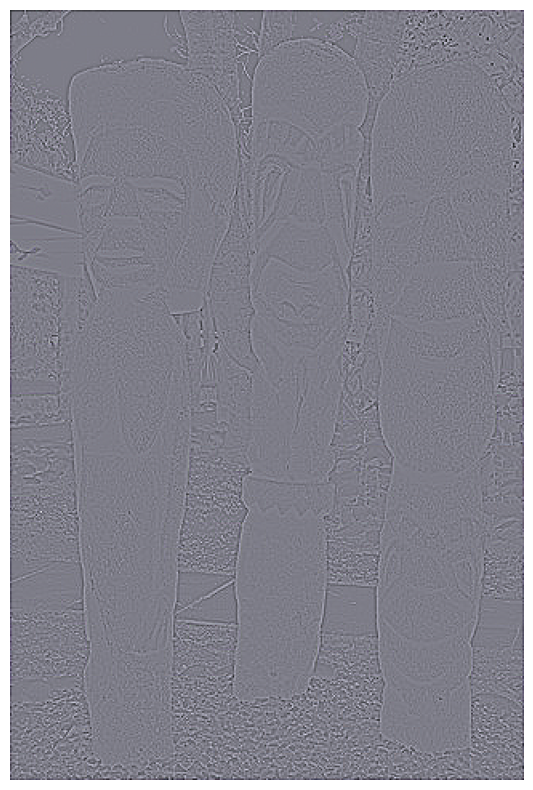

In [28]:
plt.figure(figsize=(10, 10))
plt.imshow(lap_u)
plt.axis('off')

### Convolutions

__Note.__ For a visual guide on convolutions see the paper

> Dumoulin, V., & Visin, F. (2016). [A guide to convolution arithmetic for deep learning](https://arxiv.org/pdf/1603.07285.pdf). arXiv preprint arXiv:1603.07285.

In mathematics, convolution is a mathematical operation between two functions $f$ and $g$, which produces a third function $h = f \star g$. If $f:\mathbb{R}\rightarrow\mathbb{R}$ and $g:\mathbb{R}\rightarrow\mathbb{R}$, the convolution takes the form,

$$h(t) = \int_{-\infty}^{+\infty} f(\tau)g(t-\tau)d\tau=\int_{-\infty}^{+\infty} f(t-\tau)g(\tau)d\tau$$

Intuitively, $h$ is obtained by sliding $f(\tau)$ over $g(t-\tau)$ (reflected $g$). In image procssing, $f$ and $g$ are often treated as functions of two variables, that is, $f(x, y)$ and $g(x, y)$. In this case, convolution takes the form,

$$h(x, y) = \int_{-\infty}^{+\infty}\int_{-\infty}^{+\infty}f(\tau_{x},\tau_{y})g(x-\tau_{x},y-\tau_{y})d\tau_{x}d\tau_{y} = \int_{-\infty}^{+\infty}\int_{-\infty}^{+\infty}f(x-\tau_{x},y-\tau_{y})g(\tau_{x},\tau_{y})d\tau_{x}d\tau_{y}$$

__Discretization.__ As in the previous example, one may discretize images over an uniform grid. You can think of discretization as a mixture of Dirac deltas, i.e.,

$$\hat{f}(x,y) = \sum_{i=1}^{h}\sum_{j=1}^{w}f(x_{i},y_{j})\delta\biggr((x,y) - (x_{i},y_{j})\biggr)$$

as a consequence one can represent $\hat{f}$ as the matrix $\mathbf{f} \in \mathbb{R}^{h \times w}$. The convolution of $\mathbf{f}$ with $\mathbf{g}$ is defined as,

$$h(x, y) = \sum_{i=-\infty}^{+\infty}\sum_{j=-\infty}^{+\infty}g_{i,j}f_{x-i,y-j}$$

this operation corresponds to roll $g$ over $f$ (or vice-versa).

__Filtering.__ In image processing, filtering corresponds to an operation in which a signal/image $f_{ij}$ is convoluted with a __kernel__, $\omega_{ij}$. The kernel is a small image (e.g. $3 \times 3$) that extracts or highlights certain features from the image. In our discussion about the Laplacian, we saw that this operation __highlights edges__ in the image. Especially, recall that we can re-write the Laplacian as a filter, by looking at its operation at the level of a pixel,

$$(\Delta u)_{i,j} = u_{i+1,j}+u_{i,j+1}-4u_{i,j}+u_{i-1,j}+u_{i,j-1}$$

hence we can write it as,

$$
\begin{bmatrix}
0 & 1 & 0\\
1 & -4 & 1\\
0 & 1 & 0
\end{bmatrix}
$$

roughly, it compares the central pixel $(i,j)$ with the neighboring pixels. Due the intrinsic geometry of edges, this allows this filter to detect both horizontal and vertical edges.

#### Heat Equation - Convolution

In [29]:
laplacian_filter = np.array([
    [0, +1, 0],
    [+1, -4, +1],
    [0, +1, 0]
])

In [30]:
laplacian_filter

array([[ 0,  1,  0],
       [ 1, -4,  1],
       [ 0,  1,  0]])

In [31]:
im = np.array(Image.open('../data/101085.jpg'))

print(im.shape, im.dtype, im.max(), im.min())

(481, 321, 3) uint8 255 0


In [32]:
u0 = (im.astype(float) / 255)

(-0.5, 320.5, 480.5, -0.5)

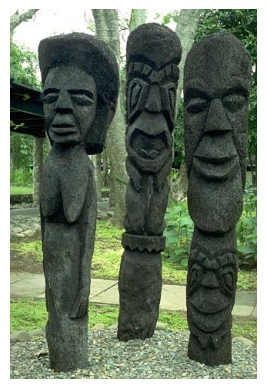

In [33]:
plt.imshow(u0)
plt.axis('off')

In [34]:
lap_u0 = np.concatenate([
    convolve2d(u0[..., c], laplacian_filter,
               mode='same')[..., None] for c in range(3)], axis=-1)

In [35]:
u0.shape, lap_u0.shape

((481, 321, 3), (481, 321, 3))

In [36]:
lap_u = (lap_u - lap_u.min(axis=(0, 1))) / (lap_u.max(axis=(0, 1)) - lap_u.min(axis=(0, 1)))

(-0.5, 320.5, 480.5, -0.5)

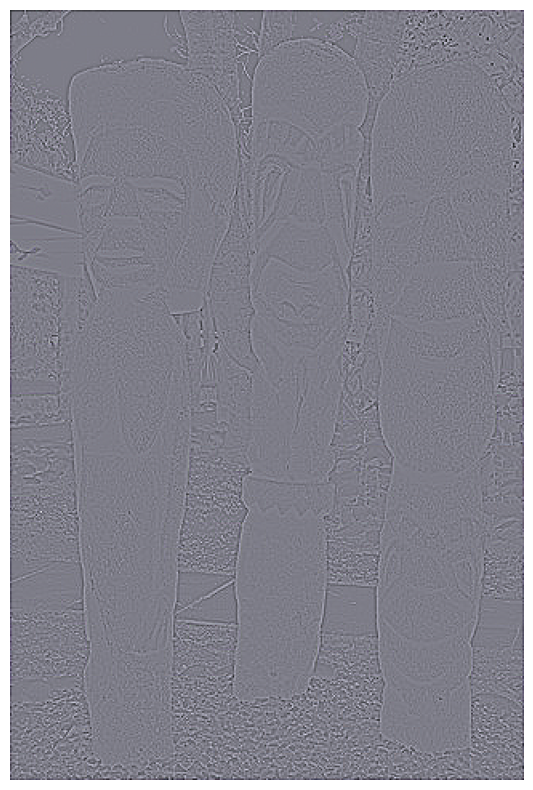

In [37]:
plt.figure(figsize=(10, 10))
plt.imshow(lap_u)
plt.axis('off')

In [38]:
n_iter = 100
h, w, c = u0.shape
U = np.zeros([n_iter, h, w, c])
U[0, ...] = u0.copy()

In [39]:
for it in tqdm(range(0, n_iter - 1)):
    lap_U = np.concatenate([convolve2d(U[it, :, :, c], laplacian_filter, mode='same')[..., None]
                            for c in range(3)], axis=-1)
    U[it + 1, ...] = U[it, ...] + 0.25 * lap_U

  0%|          | 0/99 [00:00<?, ?it/s]

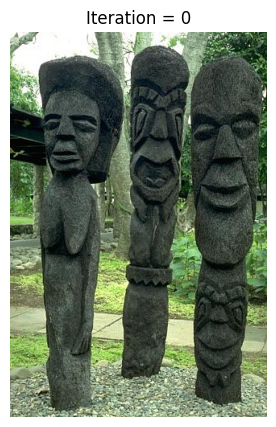

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(U[0, 1:-1, 1:-1, :], cmap=plt.cm.Reds, vmin=0., vmax=1.)
ax.set_title(f'Iteration = {0}')
ax.axis('off')

it = 0


def update(frame):
    global it
    # clear the axis each frame
    ax.clear()
    ax.imshow(frame[1:-1, 1:-1, :], cmap=plt.cm.Reds, vmin=0., vmax=1.)
    ax.set_title(f'Iteration = {it}')
    ax.axis('off')

    it += 1


anim = FuncAnimation(fig, update, frames=U[::10])

In [41]:
HTML(anim.to_jshtml())

#### Comparing filters

In [42]:
x_gradient = np.array([
    [+1, 0, -1],
    [+2, 0, -2],
    [+1, 0, -1]
])

y_gradient = np.array([
    [+1, +2, +1],
    [0, 0, 0],
    [-1, -2, -1]
])

In [43]:
im = np.array(Image.open('../data/119082.jpg'))

print(im.shape, im.dtype, im.max(), im.min())

u0 = (im.astype(float) / 255)

(321, 481, 3) uint8 255 0


In [44]:
Gx = normalize_im(
    np.concatenate([convolve2d(u0[..., c], x_gradient, mode='same')[..., None] for c in range(3)], axis=-1))

Gy = normalize_im(
    np.concatenate([convolve2d(u0[..., c], y_gradient, mode='same')[..., None] for c in range(3)], axis=-1))

Gnorm = np.sqrt(Gx ** 2 + Gy ** 2)

ims = [u0, Gx, Gy, Gnorm]

names = ['Image', 'x-Gradient', 'y-Gradient', 'Gradient (Norm)']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


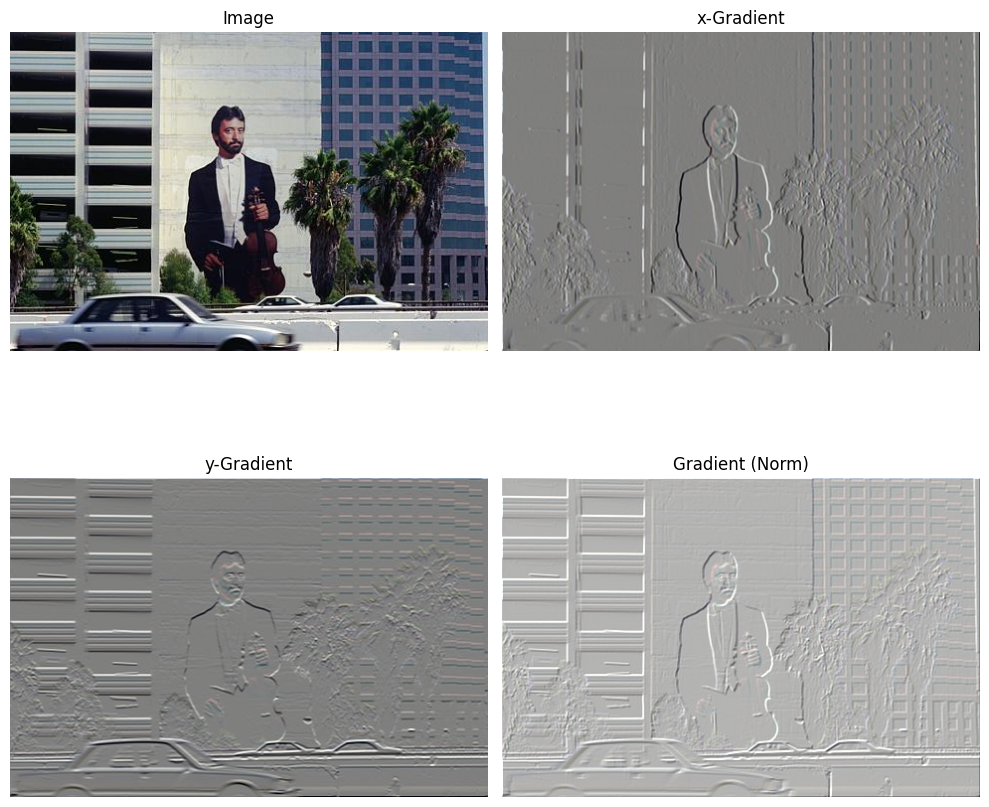

In [45]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for name, im, ax in zip(names, ims, axes.flatten()):
    ax.imshow(im)
    ax.set_title(name)
    ax.axis('off')
plt.tight_layout()

## Fourier Transform

__Def.__ Let $f:\mathbb{R}\rightarrow\mathbb{R}$ represent a signal. The (continuous) Fourier transform, $F(\omega)$ of $f$ is given by,

$$F(\omega) = \int_{-\infty}^{+\infty}f(x)exp(-2j\pi\omega x)dx$$

__Discretization.__ When $f$ is discretized over $N$ samples, i.e., $\mathbf{f} \in \mathbb{R}^{N}$ for $f_{n} = f(x_{n})$, the (Discrete) Fourier transform, or DFT, is expressed as,

$$F_{k} = \sum_{n=0}^{N-1}f_{n}exp\biggr(-\frac{2j\pi}{N}kn\biggr)$$

__Note.__ Let $\mathbf{A} \in \mathbb{R}^{N \times N}$, where $A_{k,n} = exp\biggr(-\frac{2j\pi}{N}kn\biggr)$. The elements of the matix $\mathbf{A}$ can be conveniently expressed in terms of powers of the $N$-th root of unity, i.e., $z \in \mathbb{C}$ s.t. $z^{N} = 1$, that is, $r = exp\biggr(-\frac{2j\pi}{N}\biggr)$. Computing the 1-D DFT from scratch corresponds to computing a matrix-vector product,

$$\mathbf{F} = \mathbf{Af}$$

where $\mathbf{F} \in \mathbb{R}^{N}$ is the Fourier transform, $\mathbf{A} \in \mathbb{R}^{N \times N}$ is some sort of "Fourier operator", a mapping that takes a function as input and outputs its Fourier transform, and $\mathbf{f}$ is the input function (here, discretized).

__Computational Complexity.__ Based on the FFT-formula, to compute $F_{k}$ we need a full pass over the $N$ values of the signal $\mathbf{f}$. This is done $N$ times (for $F_{1},\cdots,F_{k},\cdots,F_{N}$), hence the overall complexity of the DFT is $\mathcal{O}(N^{2})$. There exists a workaround to this complexity, based on the [Divide and Conquer principle](https://en.wikipedia.org/wiki/Divide-and-conquer_algorithm), especially through the [Fast Fourier Transform (FFT) algorithm](https://en.wikipedia.org/wiki/Fast_Fourier_transform), which alleviates the complexity to $\mathcal{O}(N\log N)$

__Def.__ Let $f:\mathbb{R}^{2}\rightarrow\mathbb{R}$ represent an image. The (continuous) Fourier transform, $F(\omega_{x},\omega_{y})$ of $f$ is given by,

$$F(\omega_{x},\omega_{y}) = \int_{-\infty}^{+\infty}\int_{-\infty}^{+\infty}f(x,y)exp\biggr{(}-2j\pi(\omega_{x}x+\omega_{y}y)\biggr{)}dxdy$$

Since $exp\biggr{(}-2j\pi(\omega_{x}x+\omega_{y}y)\biggr{)}$ is a complex number, $F(\omega_{x}, \omega_{y})$ __is complex__.

__Discretization.__ In analogy with the 1D case, the 2-D DFT is given by,

$$F_{k,l} = \sum_{n=0}^{h-1}\sum_{m=0}^{w-1}f_{n,m}\text{exp}\biggr(-2j\pi\biggr(\frac{k}{h}n + \frac{l}{w}m\biggr)\biggr)$$

In [4]:
def fourier_transform(im):
    return np.fft.fftshift(np.fft.fft2(im))

def inverse_fourier_transform(fft_im):
    return np.fft.ifft2(np.fft.ifftshift(fft_im))

In [5]:
im = np.array(Image.open('../data/119082.jpg'))
f = (im.astype(float) / 255)
f = 0.2989 * f[..., 0] + 0.5870 * f[..., 1] + 0.1140 * f[..., 2]

In [6]:
F = fourier_transform(f)

In [7]:
F.dtype

dtype('complex128')

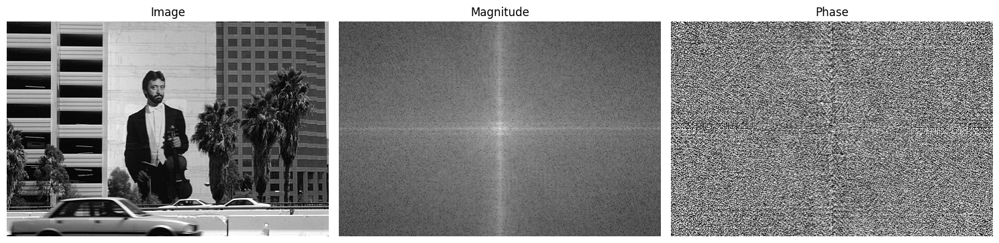

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(15, 15))

axes[0].imshow(f, cmap='gray')
axes[0].set_title('Image')
axes[0].axis('off')

axes[1].imshow(np.log(abs(F + 1e-11)), cmap='gray')
axes[1].set_title('Magnitude')
axes[1].axis('off')

axes[2].imshow(np.angle(F), cmap='gray')
axes[2].set_title('Phase')
axes[2].axis('off')

plt.tight_layout()

#### Frequency Filtering

In [9]:
h, w = F.shape
mid_h, mid_w = h // 2, w // 2
c = np.array([mid_h, mid_w]).astype(float)
grid = np.array([[[i, j] for i in range(h)] for j in range(w)]).astype(float)
D = ((grid - c) ** 2).sum(axis=-1).T

In [10]:
hF = F.copy()
hF[D <= 1000] = 0.

lF = F.copy()
lF[D > 1000] = 0.

In [13]:
hf = inverse_fourier_transform(hF).real
lf = inverse_fourier_transform(lF).real

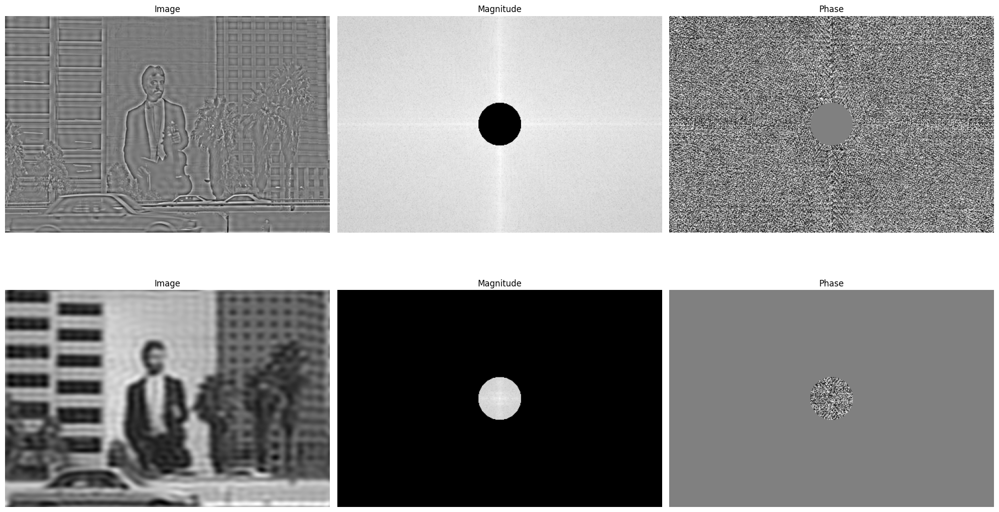

In [14]:
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

axes[0, 0].imshow(hf, cmap='gray')
axes[0, 0].set_title('Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.log(abs(hF + 1e-11)), cmap='gray')
axes[0, 1].set_title('Magnitude')
axes[0, 1].axis('off')

axes[0, 2].imshow(np.angle(hF), cmap='gray')
axes[0, 2].set_title('Phase')
axes[0, 2].axis('off')

axes[1, 0].imshow(lf, cmap='gray')
axes[1, 0].set_title('Image')
axes[1, 0].axis('off')

axes[1, 1].imshow(np.log(abs(lF + 1e-11)), cmap='gray')
axes[1, 1].set_title('Magnitude')
axes[1, 1].axis('off')

axes[1, 2].imshow(np.angle(lF), cmap='gray')
axes[1, 2].set_title('Phase')
axes[1, 2].axis('off')

plt.tight_layout()

In [15]:
G = np.zeros_like(hF)
print(G.shape)

(321, 481)


In [16]:
G[D <= 1000] = 1.

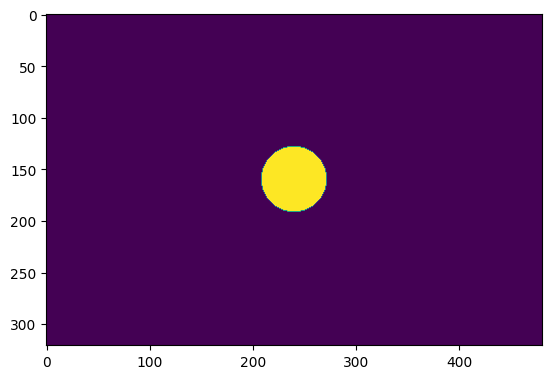

In [17]:
plt.imshow(abs(G))

In [18]:
g = inverse_fourier_transform(G)

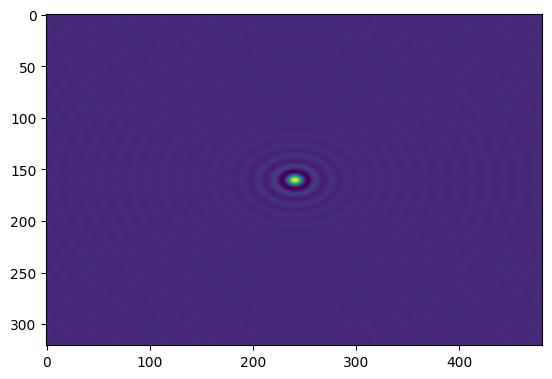

In [22]:
plt.imshow(np.fft.ifftshift(g.real))

In [27]:
x = np.arange(h)
y = np.arange(w)
X, Y = np.meshgrid(x, y)
X = X.T
Y = Y.T

In [28]:
X.shape, Y.shape, g.shape

((321, 481), (321, 481), (321, 481))

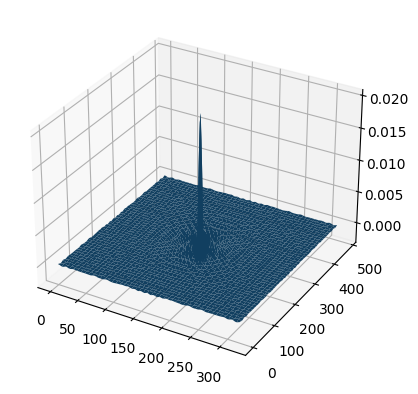

In [30]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

ax.plot_surface(X, Y, np.fft.ifftshift(g.real))